### Importing the Libraries

In [81]:
import warnings

import numpy as np 
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split,GridSearchCV,KFold,cross_val_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

%matplotlib inline
warnings.filterwarnings("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.set_option('display.max_columns', 250)

### Loading the data

In [82]:
data=pd.read_csv("train.csv")
data.shape

(1460, 81)

In [83]:
data.head(1)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500


### understanding the data and data dictionary

In [84]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

In [85]:
data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [86]:
(round(data.isnull().sum()/data.shape[0],2)*100).sort_values(ascending=False).head(20)

PoolQC          100.0
MiscFeature      96.0
Alley            94.0
Fence            81.0
FireplaceQu      47.0
LotFrontage      18.0
GarageType        6.0
GarageCond        6.0
GarageYrBlt       6.0
GarageFinish      6.0
GarageQual        6.0
BsmtFinType1      3.0
BsmtExposure      3.0
BsmtCond          3.0
BsmtQual          3.0
BsmtFinType2      3.0
MasVnrArea        1.0
MasVnrType        1.0
Exterior2nd       0.0
Exterior1st       0.0
dtype: float64

removing the columns having large portion of  missing values i.e more than 40%

In [87]:
data.drop(columns=["PoolQC","MiscFeature","Alley","Fence","FireplaceQu"],inplace=True)

In [88]:
(round(data.isnull().sum()/data.shape[0],2)*100).sort_values(ascending=False).head(20)

LotFrontage     18.0
GarageType       6.0
GarageYrBlt      6.0
GarageFinish     6.0
GarageCond       6.0
GarageQual       6.0
BsmtFinType1     3.0
BsmtExposure     3.0
BsmtCond         3.0
BsmtQual         3.0
BsmtFinType2     3.0
MasVnrType       1.0
MasVnrArea       1.0
RoofMatl         0.0
RoofStyle        0.0
SalePrice        0.0
Exterior1st      0.0
Exterior2nd      0.0
YearBuilt        0.0
ExterQual        0.0
dtype: float64

Id is of no use it is just an index

In [89]:
data.drop(columns=["Id"],inplace=True)

In [90]:
#Checking the unique values of each columns
col=data.columns
for i in col:
    print("The different values for column:",i )
    print(data[i].value_counts())
    print("\n\n")


The different values for column: MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64



The different values for column: MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64



The different values for column: LotFrontage
60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
24.0      19
64.0      19
73.0      18
72.0      17
79.0      17
63.0      17
55.0      17
100.0     16
51.0      15
66.0      15
74.0      15
52.0      14
59.0      13
71.0      12
82.0      12
40.0      12
43.0      12
67.0      12
57.0      12
69.0      11
76.0      11
86.0      10
53.0      10
34.0      10
92.0      10
88.0      10
62.0       9
44.0       9
84.0       9
77.0       9
35.0       9
93.0       8

#### removing the columns having single unique value as it will make no sense modelling as well as analysis

In [91]:
data.drop(columns=["LowQualFinSF","BsmtFinSF2","EnclosedPorch","3SsnPorch","ScreenPorch","PoolArea","MiscVal"],inplace=True)

In [92]:
categorical=data.select_dtypes(include=['object']).columns.tolist()
numerical=data.select_dtypes(exclude=['object']).columns.tolist()

## Data preparation

### Outliers treatment

In [93]:
outliers_percentage={}

for feature in numerical:
    IQR=data[feature].quantile(.75)-data[feature].quantile(.25)
    outliers_count=data[(data[feature]>(data[feature].quantile(.75)+1.5*IQR)) | (data[feature]<(data[feature].quantile(.25)-1.5*IQR))].shape[0]
    outliers_percentage[feature]=round(outliers_count/data.shape[0]*100,2)
    
outlier_df=pd.DataFrame({'Features':list(outliers_percentage.keys()),'Percentage':list(outliers_percentage.values())})
outlier_df.sort_values(by="Percentage", ascending=False)

,Features,Percentage
4,OverallCond,8.56
0,MSSubClass,7.05
7,MasVnrArea,6.58
1,LotFrontage,6.03
15,BsmtHalfBath,5.62
26,OpenPorchSF,5.27
2,LotArea,4.73
19,KitchenAbvGr,4.66
29,SalePrice,4.18
10,TotalBsmtSF,4.18


In [94]:
cols_for_outliers_treatment = ["MasVnrArea","LotFrontage","OpenPorchSF","LotArea","SalePrice","TotalBsmtSF","WoodDeckSF","GrLivArea","BsmtUnfSF","GarageArea","1stFlrSF","BsmtFinSF1","2ndFlrSF"]

In [95]:
for feature in cols_for_outliers_treatment:
    IQR = data[feature].quantile(.75) - data[feature].quantile(.25) 
    max_value = data[feature].quantile(.75)+1.5*IQR
    min_value = data[feature].quantile(.25)-1.5*IQR
    data[feature][data[feature] > max_value] = max_value
    data[feature][data[feature] < min_value ] = min_value

### Missing value imputation

In [96]:
data["LotFrontage"].fillna(data["LotFrontage"].mean(),inplace=True)
data["GarageType"].fillna(data["GarageType"].mode()[0],inplace=True)
data["GarageYrBlt"].fillna(data["GarageYrBlt"].mode()[0],inplace=True)
data["GarageFinish"].fillna(data["GarageFinish"].mode()[0],inplace=True)
data["GarageCond"].fillna(data["GarageCond"].mode()[0],inplace=True)
data["GarageQual"].fillna(data["GarageQual"].mode()[0],inplace=True)
data["BsmtFinType1"].fillna(data["BsmtFinType1"].mode()[0],inplace=True)
data["BsmtExposure"].fillna(data["BsmtExposure"].mode()[0],inplace=True)
data["BsmtCond"].fillna(data["BsmtCond"].mode()[0],inplace=True)
data["BsmtQual"].fillna(data["BsmtQual"].mode()[0],inplace=True)
data["BsmtFinType2"].fillna(data["BsmtFinType2"].mode()[0],inplace=True)
data["MasVnrType"].fillna(data["MasVnrType"].mode()[0],inplace=True)
data["MasVnrArea"].fillna(data["MasVnrArea"].mean(),inplace=True)
data["Electrical"].fillna(data["Electrical"].mode()[0],inplace=True)


## EDA

In [97]:
# all numeric (float and int) variables in the dataset
data_numeric = data.select_dtypes(include=['float64', 'int64'])
data_numeric.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,60,65.0,8450.0,7,5,2003,2003,196.0,706.0,150.0,856,856.0,854,1710.0,1,0,2,1,3,1,8,0,2003.0,2,548.0,0,61,2,2008,208500.0
1,20,80.0,9600.0,6,8,1976,1976,0.0,978.0,284.0,1262,1262.0,0,1262.0,0,1,2,0,3,1,6,1,1976.0,2,460.0,298,0,5,2007,181500.0
2,60,68.0,11250.0,7,5,2001,2002,162.0,486.0,434.0,920,920.0,866,1786.0,1,0,2,1,3,1,6,1,2001.0,2,608.0,0,42,9,2008,223500.0
3,70,60.0,9550.0,7,5,1915,1970,0.0,216.0,540.0,756,961.0,756,1717.0,1,0,1,0,3,1,7,1,1998.0,3,642.0,0,35,2,2006,140000.0
4,60,84.0,14260.0,8,5,2000,2000,350.0,655.0,490.0,1145,1145.0,1053,2198.0,1,0,2,1,4,1,9,1,2000.0,3,836.0,192,84,12,2008,250000.0


<Figure size 1440x1080 with 0 Axes>

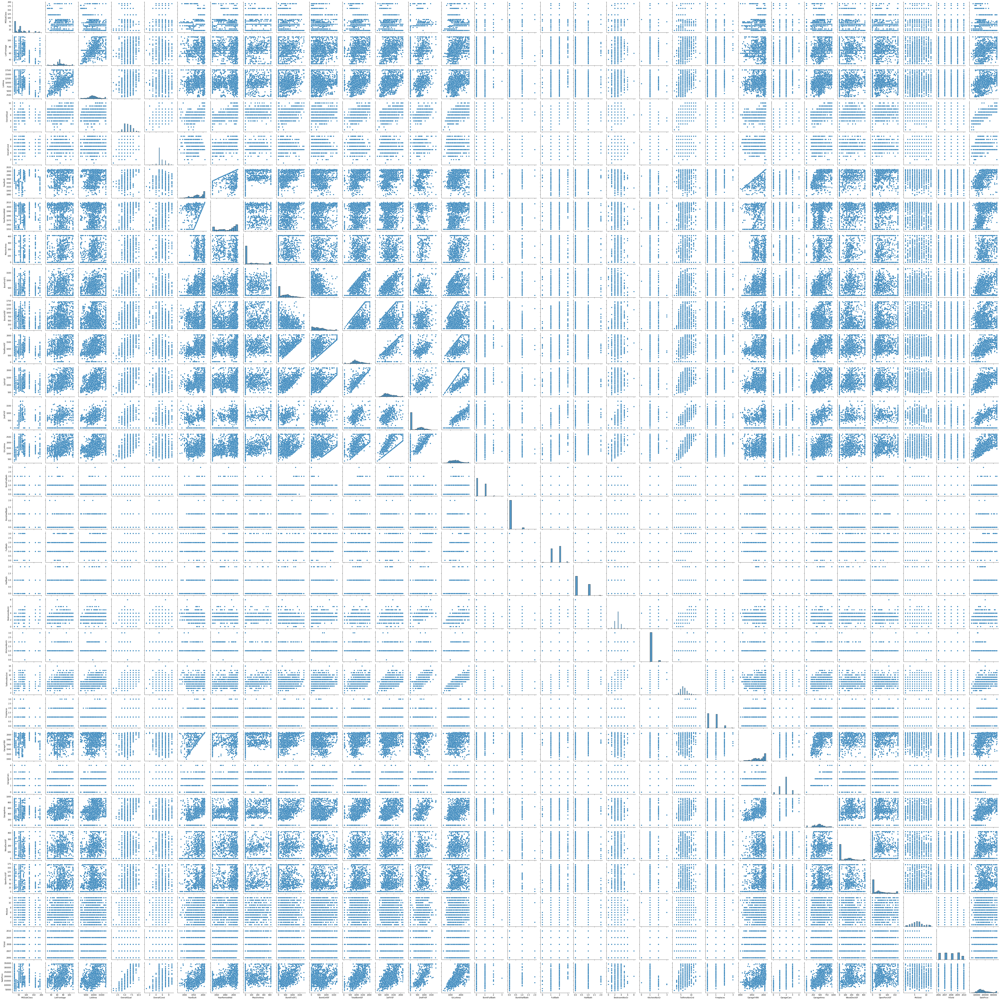

In [98]:
#pairplot between the numerical columns
plt.figure(figsize=(20,15))
sns.pairplot(data_numeric)
plt.show()

#LotFrontage,LotArea,yearbuilt yearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea have higher correlation with sales price

In [99]:
data_categorical = data.select_dtypes(include=['object'])

In [100]:
# MSSubClass,OverallQual,OverallCond this is categorical just like rating
# YearBuilt,YearRemodAdd,GarageYrBlt,YrSold,MoSold,GarageYrBlt -date column

#### correlation plot 

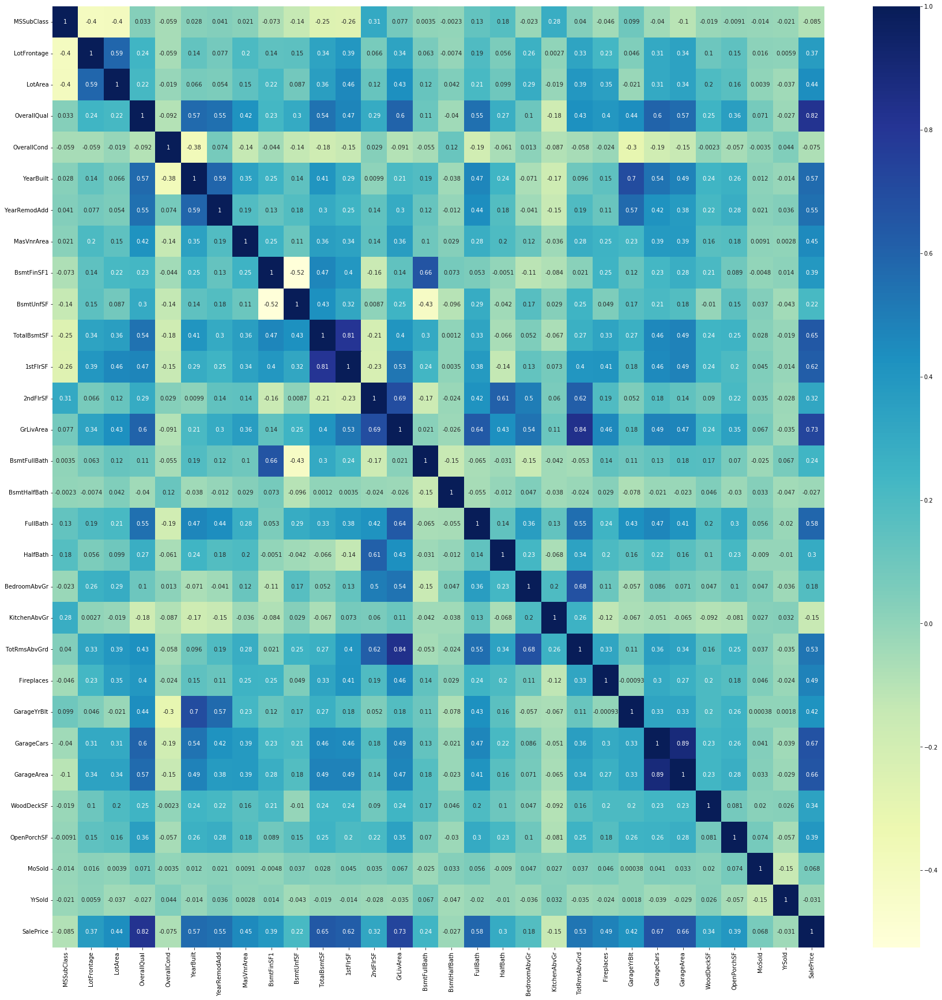

In [101]:
plt.figure(figsize = (30, 30))
sns.heatmap(data_numeric.corr(), annot = True, cmap="YlGnBu")
plt.show()

### Conversion with respect to categorical variable

In [102]:
data_categorical.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [103]:
for i in data_categorical.columns:
    print(i)
    print(data_categorical[i].value_counts())
    print("\n\n")

MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64



Street
Pave    1454
Grvl       6
Name: Street, dtype: int64



LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64



LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64



Utilities
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64



LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64



LandSlope
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64



Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPk

In [104]:
data["Street"]=data["Street"].map({'Pave':0,'Grvl':1})
data["LotShape"]=data["LotShape"].map({'Reg':3,'IR1':2,'IR2':1,'IR3':0})
data["Utilities"]=data["Utilities"].map({'AllPub':1,'NoSeWa':0})
data['LandSlope'] = data.LandSlope.map({'Gtl':2,'Mod':1,'Sev':0})
data['ExterQual'] = data.ExterQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
data['ExterCond'] = data.ExterCond.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
data['BsmtQual'] = data.BsmtQual.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
data['BsmtCond'] = data.BsmtCond.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
data['BsmtExposure'] = data.BsmtExposure.map({'NA':0,'No':1,'Mn':2,'Av':3,'Gd':4})
data['BsmtFinType1'] = data.BsmtFinType1.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
data['BsmtFinType2'] = data.BsmtFinType2.map({'NA':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
data['HeatingQC'] = data.HeatingQC.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
data['CentralAir'] = data.CentralAir.map({'N':0,'Y':1})
data['KitchenQual'] = data.KitchenQual.map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
data['GarageFinish'] = data.GarageFinish.map({'NA':0,'Unf':1,'RFn':2,'Fin':3})
data['GarageQual'] = data.GarageQual.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})
data['GarageCond'] = data.GarageCond.map({'NA':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5})

In [105]:
MSSubClass_modify = {20:'1-STORY 1946 & NEWER ALL STYLES', 30:'1-STORY 1945 & OLDER', 40:'1-STORY W/FINISHED ATTIC ALL AGES', 45:'1-1/2 STORY - UNFINISHED ALL AGES',50:'1-1/2 STORY FINISHED ALL AGES',60:'2-STORY 1946 & NEWER',70:'2-STORY 1945 & OLDER',75:'2-1/2 STORY ALL AGES',80:'SPLIT OR MULTI-LEVEL',85:'SPLIT FOYER',90:'DUPLEX - ALL STYLES AND AGES',120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',150:"1-1/2 STORY PUD - ALL AGES",160:"2-STORY PUD - 1946 & NEWER",180:"PUD - MULTILEVEL - INCL SPLIT LEV/FOYER",190:"2 FAMILY CONVERSION - ALL STYLES AND AGES"}
data['MSSubClass'] = data['MSSubClass'].map(MSSubClass_modify)

In [106]:
Categorical_columns=data_categorical.columns

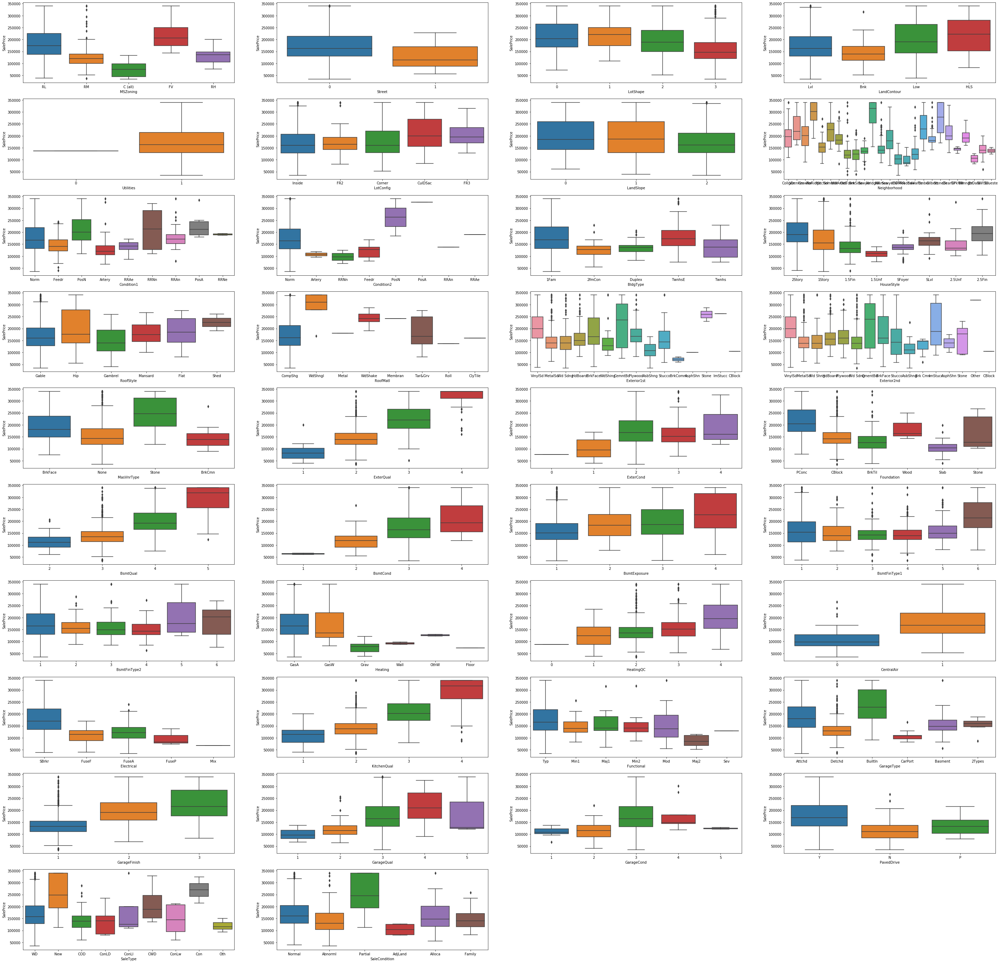

In [107]:
plt.figure(figsize=(50, 50))
for i in enumerate(Categorical_columns):
    plt.subplot(10,4,i[0]+1)
    sns.boxplot(data=data, x=i[1], y='SalePrice')
plt.show()


In [108]:
dummy_col = pd.get_dummies(data[['MSSubClass','MSZoning','LandContour','LotConfig','Neighborhood','Condition1','Condition2',
             'BldgType','HouseStyle','RoofStyle','RoofMatl',  'Exterior1st',"Exterior2nd",'MasVnrType','Foundation',
             'Heating','Electrical','Functional','GarageType','PavedDrive','SaleType','SaleCondition']],
                           drop_first=True)
data = pd.concat([data,dummy_col],axis='columns')

data = data.drop(['MSSubClass','MSZoning','LandContour','LotConfig','Neighborhood','Condition1','Condition2',
             'BldgType','HouseStyle','RoofStyle','RoofMatl',  'Exterior1st',"Exterior2nd",'MasVnrType','Foundation',
             'Heating','Electrical','Functional','GarageType','PavedDrive','SaleType','SaleCondition'],axis='columns')


In [109]:
#performing the train test split
np.random.seed(0)
df_train, df_test = train_test_split(data, train_size = 0.7, test_size = 0.3, random_state = 100)

In [110]:
# scaling the numerical values
scaler = MinMaxScaler()
num_vars=["LotFrontage","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","TotalBsmtSF","1stFlrSF","2ndFlrSF","GrLivArea","GarageArea","WoodDeckSF","OpenPorchSF","SalePrice"]
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

In [111]:
#creating the X_train and y_train
y_train=df_train.pop("SalePrice")
X_train=df_train

In [112]:
#finding the top 0 features using RFE 
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, 100) 
rfe = rfe.fit(X_train, y_train)


In [113]:
col = X_train.columns[rfe.support_]
X_train_RFE=X_train[col]

## Model 1

In [114]:
X_train_rfe = sm.add_constant(X_train_RFE)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     145.8
Date:                Wed, 08 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:35   Log-Likelihood:                 1513.7
No. Observations:                1021   AIC:                            -2833.
Df Residuals:                     924   BIC:                            -2355.
Df Model:                          96                                         
Covariance Type:            nonrobust                                         
                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------

In [115]:
vif = pd.DataFrame()
vif['Features'] = X_train_RFE.columns
vif['VIF'] = [variance_inflation_factor(X_train_RFE.values, i) for i in range(X_train_RFE.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
99,SaleCondition_Partial,inf
73,Exterior2nd_CBlock,inf
47,BldgType_2fmCon,inf
48,BldgType_Duplex,inf
66,Exterior1st_CBlock,inf
16,MSSubClass_DUPLEX - ALL STYLES AND AGES,inf
13,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AN...,inf
94,SaleType_New,inf
1,Utilities,878.38
57,RoofMatl_CompShg,744.18


In [116]:
#since temp has both high VIF and p value so dropping that from the features
X_train_RFE.drop(columns=["SaleCondition_Partial","Exterior2nd_CBlock","BldgType_2fmCon","BldgType_Duplex","Exterior1st_CBlock","MSSubClass_DUPLEX - ALL STYLES AND AGES","MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES","SaleType_New"],axis=1,inplace=True)

### Model 2

In [117]:
X_train_rfe = sm.add_constant(X_train_RFE)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     147.0
Date:                Wed, 08 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:38   Log-Likelihood:                 1495.4
No. Observations:                1021   AIC:                            -2805.
Df Residuals:                     928   BIC:                            -2346.
Df Model:                          92                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [118]:
vif = pd.DataFrame()
vif['Features'] = X_train_RFE.columns
vif['VIF'] = [variance_inflation_factor(X_train_RFE.values, i) for i in range(X_train_RFE.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Utilities,844.72
53,RoofMatl_CompShg,721.13
39,Condition2_Norm,500.58
18,MSZoning_RL,131.83
2,OverallQual,85.66
5,BsmtQual,84.69
82,GarageType_Attchd,42.52
3,OverallCond,40.01
10,KitchenAbvGr,34.97
64,Exterior1st_MetalSd,33.15


In [119]:
X_train_RFE.drop(columns=["Utilities","RoofMatl_CompShg","Condition2_Norm","MSZoning_RL"],axis=1,inplace=True)

### Model3

In [120]:
X_train_rfe = sm.add_constant(X_train_RFE)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     130.7
Date:                Wed, 08 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:43   Log-Likelihood:                 1416.3
No. Observations:                1021   AIC:                            -2655.
Df Residuals:                     932   BIC:                            -2216.
Df Model:                          88                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [121]:
vif = pd.DataFrame()
vif['Features'] = X_train_RFE.columns
vif['VIF'] = [variance_inflation_factor(X_train_RFE.values, i) for i in range(X_train_RFE.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,OverallQual,82.18
4,BsmtQual,72.03
2,OverallCond,34.51
78,GarageType_Attchd,34.07
60,Exterior1st_MetalSd,33.13
65,Exterior2nd_MetalSd,32.61
9,KitchenAbvGr,27.78
77,Functional_Typ,22.48
6,TotalBsmtSF,21.34
30,Condition1_Norm,20.42


In [122]:
X_train_RFE.drop(columns=["OverallQual","BsmtQual","OverallCond","GarageType_Attchd","Exterior1st_MetalSd","Exterior2nd_MetalSd"],axis=1,inplace=True)

### Model4

In [123]:
X_train_rfe = sm.add_constant(X_train_RFE)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     101.8
Date:                Wed, 08 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:48   Log-Likelihood:                 1264.0
No. Observations:                1021   AIC:                            -2362.
Df Residuals:                     938   BIC:                            -1953.
Df Model:                          82                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [124]:
vif = pd.DataFrame()
vif['Features'] = X_train_RFE.columns
vif['VIF'] = [variance_inflation_factor(X_train_RFE.values, i) for i in range(X_train_RFE.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,KitchenAbvGr,25.20
60,Exterior2nd_CmentBd,20.32
55,Exterior1st_CemntBd,20.32
3,TotalBsmtSF,19.57
72,Functional_Typ,18.13
4,GrLivArea,17.22
27,Condition1_Norm,16.62
7,GarageArea,13.12
0,LotArea,13.09
43,HouseStyle_SLvl,10.41


In [125]:
X_train_RFE.drop(columns=["KitchenAbvGr","Exterior2nd_CmentBd","Exterior1st_CemntBd","Functional_Typ","Condition1_Norm"],axis=1,inplace=True)

### model 6

In [126]:
X_train_rfe = sm.add_constant(X_train_RFE)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.869
Method:                 Least Squares   F-statistic:                     88.64
Date:                Wed, 08 Jun 2022   Prob (F-statistic):               0.00
Time:                        18:34:53   Log-Likelihood:                 1170.2
No. Observations:                1021   AIC:                            -2184.
Df Residuals:                     943   BIC:                            -1800.
Df Model:                          77                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [127]:
vif = pd.DataFrame()
vif['Features'] = X_train_RFE.columns
vif['VIF'] = [variance_inflation_factor(X_train_RFE.values, i) for i in range(X_train_RFE.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,TotalBsmtSF,17.42
4,GrLivArea,15.55
6,GarageArea,13.07
0,LotArea,12.64
41,HouseStyle_SLvl,10.38
10,MSSubClass_SPLIT OR MULTI-LEVEL,10.20
60,Foundation_PConc,7.07
59,Foundation_CBlock,6.24
55,Exterior1st_Wd Sdng,6.18
76,SaleCondition_Normal,6.07


In [128]:
columns=X_train_RFE.columns
num_vars=["LotFrontage","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","TotalBsmtSF","1stFlrSF","2ndFlrSF","GrLivArea","GarageArea","WoodDeckSF","OpenPorchSF","SalePrice"]
df_test[num_vars] = scaler.transform(df_test[num_vars])
y_test=df_test.pop('SalePrice')
X_test=df_test[columns]
X_test_rfe = sm.add_constant(X_test)
y_test_pred=lm.predict(X_test_rfe)
r_squared = r2_score(y_test, y_test_pred)
r_squared

0.8271314094178055

### Lasso Regresion

In [129]:
lm = Lasso(alpha=0.001)
lm.fit(X_train_RFE,y_train)

y_train_pred = lm.predict(X_train_RFE)
print(r2_score(y_true=y_train,y_pred=y_train_pred))

y_test_pred  = lm.predict(X_test)
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.8461533367521139
0.8265023055278131


In [130]:
model_parameter = list(lm.coef_)
model_parameter.insert(0,lm.intercept_)
model_parameter = [round(x,3) for x in model_parameter]
col = df_train.columns
col.insert(0,'Constant')
list(zip(col,model_parameter))

[('LotFrontage', 0.021),
 ('LotArea', 0.04),
 ('Street', 0.035),
 ('LotShape', 0.069),
 ('Utilities', 0.181),
 ('LandSlope', 0.379),
 ('OverallQual', 0.02),
 ('OverallCond', 0.178),
 ('YearBuilt', 0.045),
 ('YearRemodAdd', 0.0),
 ('MasVnrArea', -0.005),
 ('ExterQual', 0.0),
 ('ExterCond', 0.0),
 ('BsmtQual', -0.0),
 ('BsmtCond', -0.02),
 ('BsmtExposure', 0.0),
 ('BsmtFinType1', 0.073),
 ('BsmtFinSF1', -0.0),
 ('BsmtFinType2', -0.019),
 ('BsmtUnfSF', -0.0),
 ('TotalBsmtSF', 0.048),
 ('HeatingQC', 0.098),
 ('CentralAir', 0.078),
 ('1stFlrSF', 0.031),
 ('2ndFlrSF', 0.03),
 ('GrLivArea', 0.014),
 ('BsmtFullBath', -0.041),
 ('BsmtHalfBath', 0.0),
 ('FullBath', -0.0),
 ('HalfBath', -0.0),
 ('BedroomAbvGr', -0.0),
 ('KitchenAbvGr', 0.0),
 ('KitchenQual', -0.0),
 ('TotRmsAbvGrd', 0.0),
 ('Fireplaces', -0.0),
 ('GarageYrBlt', -0.0),
 ('GarageFinish', -0.0),
 ('GarageCars', 0.0),
 ('GarageArea', -0.006),
 ('GarageQual', 0.0),
 ('GarageCond', -0.0),
 ('WoodDeckSF', 0.0),
 ('OpenPorchSF', 0.0),
 (

In [131]:
folds = KFold(n_splits=10,shuffle=True,random_state=42)

hyper_param = {'alpha':[0.001, 0.01, 0.1,1.0, 5.0, 10.0,20.0]}

model = Lasso()

model_cv = GridSearchCV(estimator = model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True
                       )

model_cv.fit(X_train,y_train)

Fitting 10 folds for each of 7 candidates, totalling 70 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    2.3s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 5.0, 10.0, 20.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [132]:
cv_result_l = pd.DataFrame(model_cv.cv_results_)
cv_result_l['param_alpha'] = cv_result_l['param_alpha'].astype('float32')
cv_result_l.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.035940,0.007820,0.004621,0.002294,0.001,{'alpha': 0.001},8.986206e-01,0.899439,0.905269,0.814888,0.901139,0.935785,0.931449,0.896152,0.787698,0.916296,0.888674,0.045994,1,0.905889,0.906196,0.905991,0.911901,0.905908,0.901949,0.902597,0.905394,0.913517,0.903942,0.906328,0.003506
1,0.025299,0.009075,0.004345,0.001589,0.010,{'alpha': 0.01},8.104180e-01,0.791845,0.832026,0.702304,0.785165,0.822979,0.871074,0.776082,0.695877,0.828334,0.791610,0.052969,2,0.797704,0.799724,0.796973,0.810699,0.800346,0.794499,0.792518,0.802124,0.814997,0.795734,0.800532,0.006783
2,0.017452,0.001573,0.003457,0.000220,0.100,{'alpha': 0.1},5.803941e-01,0.477748,0.593374,0.467006,0.545335,0.485188,0.588798,0.569726,0.585804,0.571544,0.546492,0.047595,3,0.554663,0.548964,0.553063,0.570158,0.564244,0.553003,0.531513,0.560363,0.565495,0.552508,0.555397,0.010270
3,0.025008,0.005742,0.004237,0.001027,1.000,{'alpha': 1.0},3.803424e-01,0.259861,0.394451,0.297985,0.367861,0.270059,0.382341,0.364301,0.410013,0.377567,0.350478,0.051036,4,0.351258,0.369039,0.351826,0.367737,0.358217,0.364820,0.353394,0.352732,0.347932,0.353417,0.357037,0.007134
4,0.018927,0.002041,0.004504,0.000795,5.000,{'alpha': 5.0},-2.902504e-08,-0.000069,-0.010795,-0.002995,-0.000385,-0.001594,-0.000942,-0.028495,-0.001830,-0.005161,-0.005227,0.008354,5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


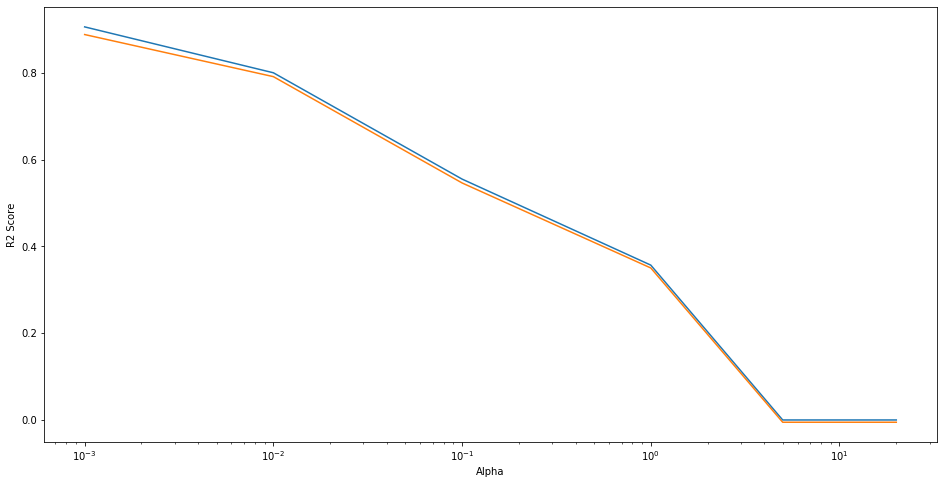

In [133]:
plt.figure(figsize=(16,8))
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_train_score'])
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_test_score'])
plt.xscale('log')
plt.ylabel('R2 Score')
plt.xlabel('Alpha')
plt.show()

In [134]:
model_cv.best_params_

{'alpha': 0.001}

In [135]:
lasso = Lasso(alpha=0.001)
lasso.fit(X_train_RFE,y_train)

y_train_pred = lasso.predict(X_train_RFE)
y_test_pred = lasso.predict(X_test)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.8461533367521139
0.8265023055278131


In [136]:
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = df_train.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(10)


,Featuere,Coef
5,LandSlope,0.378516
4,Utilities,0.181080
7,OverallCond,0.177727
21,HeatingQC,0.098429
22,CentralAir,0.077803
16,BsmtFinType1,0.072834
3,LotShape,0.068936
61,MSZoning_RL,0.067899
20,TotalBsmtSF,0.048384
8,YearBuilt,0.044729


### Ridge Regression

In [137]:
ridge = Ridge(alpha=0.001)
ridge.fit(X_train_RFE,y_train)

y_train_pred = ridge.predict(X_train_RFE)
print(r2_score(y_train,y_train_pred))
y_test_pred = ridge.predict(X_test)
print(r2_score(y_test,y_test_pred))

0.8786144500057363
0.8271692470381179


In [138]:
folds  = KFold(n_splits=10,shuffle=True,random_state=42)

hyper_param = {'alpha':[0.001,0.01,0.1,0.2,0.5,0.9,1.0, 5.0, 10.0,20.0]}

model = Ridge()

model_cv = GridSearchCV(estimator=model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True)

model_cv.fit(X_train,y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished


GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [0.001, 0.01, 0.1, 0.2, 0.5, 0.9, 1.0, 5.0,
                                   10.0, 20.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [139]:
cv_result_r = pd.DataFrame(model_cv.cv_results_)
cv_result_r['param_alpha'] = cv_result_r['param_alpha'].astype('float32')
cv_result_r.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.019684,0.005411,0.004164,0.001024,0.001,{'alpha': 0.001},0.915105,0.869494,0.637219,0.777928,0.892425,0.844008,0.919819,0.918369,0.804840,0.893954,0.847316,0.083888,10,0.952067,0.950956,0.952038,0.951665,0.953200,0.949907,0.950701,0.951526,0.951946,0.953412,0.951742,0.001014
1,0.016695,0.001471,0.003618,0.000089,0.010,{'alpha': 0.01},0.914870,0.872759,0.669647,0.783460,0.893424,0.860852,0.920554,0.917824,0.806144,0.894912,0.853445,0.075554,9,0.951982,0.950896,0.951987,0.951581,0.953111,0.949837,0.950611,0.951444,0.951938,0.953320,0.951671,0.001010
2,0.015815,0.000062,0.003508,0.000028,0.100,{'alpha': 0.1},0.913449,0.886836,0.803828,0.803213,0.898253,0.919798,0.921931,0.915307,0.811626,0.899737,0.877398,0.047731,8,0.949731,0.949014,0.950353,0.949398,0.950758,0.947689,0.948292,0.949277,0.951655,0.950860,0.949703,0.001161
3,0.016021,0.000267,0.004726,0.002440,0.200,{'alpha': 0.2},0.912808,0.892171,0.843474,0.807716,0.900600,0.931838,0.922101,0.914965,0.814211,0.902407,0.884229,0.043060,7,0.947836,0.947222,0.948695,0.947654,0.948784,0.945699,0.946384,0.947432,0.951162,0.948811,0.947968,0.001440
4,0.016375,0.000322,0.003634,0.000070,0.500,{'alpha': 0.5},0.911769,0.897534,0.873893,0.809776,0.903810,0.937321,0.923053,0.915543,0.817014,0.907193,0.889691,0.041258,5,0.944429,0.943872,0.945447,0.944871,0.945246,0.942078,0.942963,0.944031,0.949438,0.945161,0.944754,0.001861


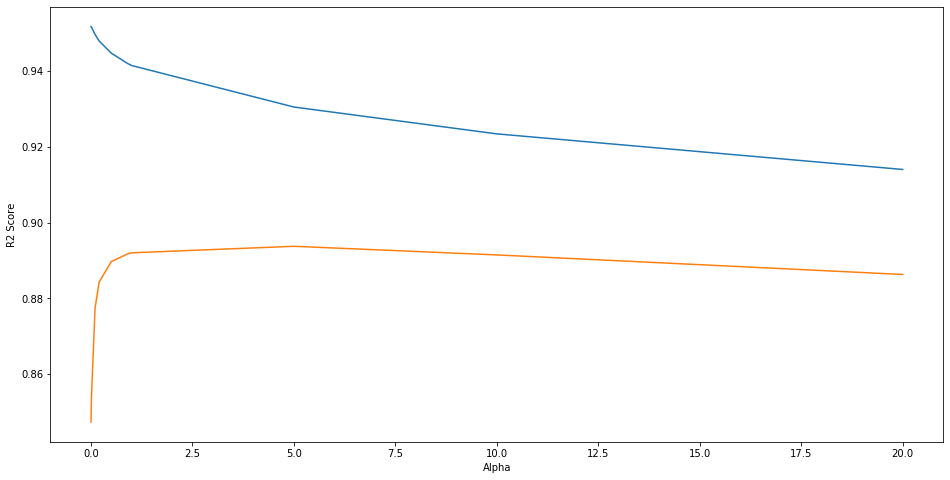

In [140]:
plt.figure(figsize=(16,8))
plt.plot(cv_result_r['param_alpha'],cv_result_r['mean_train_score'])
plt.plot(cv_result_r['param_alpha'],cv_result_r['mean_test_score'])
plt.xlabel('Alpha')
plt.ylabel('R2 Score')
plt.show()

In [141]:
model_cv.best_params_

{'alpha': 5.0}

In [142]:
ridge = Ridge(alpha = 5)
ridge.fit(X_train_RFE,y_train)

y_pred_train = ridge.predict(X_train_RFE)
print(r2_score(y_train,y_pred_train))

y_pred_test = ridge.predict(X_test)
print(r2_score(y_test,y_pred_test))


0.8634478991610015
0.8368064647533442


In [143]:
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = df_train.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']


In [144]:
ridge_coef.sort_values(by='Coef',ascending=False).head(10)


,Feaure,Coef
5,LandSlope,0.320428
4,Utilities,0.167888
7,OverallCond,0.163513
21,HeatingQC,0.115451
22,CentralAir,0.098349
23,1stFlrSF,0.094311
16,BsmtFinType1,0.090899
20,TotalBsmtSF,0.084055
3,LotShape,0.076503
25,GrLivArea,0.072246


The best model among the three (Linear regression ,lasso regression and ridge regression) is ridge regression 
because of the higher r-squared for the test set 

The important parameters are landscape ,Utilities,OverallCond,HeatingQC,CentralAir

### Question solutions

In [74]:
lasso = Lasso(alpha=0.002)
lasso.fit(X_train_RFE,y_train)

y_train_pred = lasso.predict(X_train_RFE)
y_test_pred = lasso.predict(X_test)

print(r2_score(y_true=y_train,y_pred=y_train_pred))
print(r2_score(y_true=y_test,y_pred=y_test_pred))

0.8285318835991963
0.8123908216869761


In [76]:
model_param = list(lasso.coef_)
model_param.insert(0,lasso.intercept_)
cols = df_train.columns
cols.insert(0,'const')
lasso_coef = pd.DataFrame(list(zip(cols,model_param)))
lasso_coef.columns = ['Featuere','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(10)


,Featuere,Coef
5,LandSlope,0.387554
7,OverallCond,0.181709
4,Utilities,0.178466
61,MSZoning_RL,0.078359
21,HeatingQC,0.073063
3,LotShape,0.059754
22,CentralAir,0.044704
16,BsmtFinType1,0.038607
8,YearBuilt,0.035840
2,Street,0.035701


In [75]:
ridge = Ridge(alpha = 10)
ridge.fit(X_train_RFE,y_train)

y_pred_train = ridge.predict(X_train_RFE)
print(r2_score(y_train,y_pred_train))

y_pred_test = ridge.predict(X_test)
print(r2_score(y_test,y_pred_test))


0.8549714562617017
0.8307917933160219


In [77]:
model_parameter = list(ridge.coef_)
model_parameter.insert(0,ridge.intercept_)
cols = df_train.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,model_parameter)))
ridge_coef.columns = ['Feaure','Coef']
ridge_coef.sort_values(by='Coef',ascending=False).head(10)


,Feaure,Coef
5,LandSlope,0.283762
7,OverallCond,0.160696
4,Utilities,0.159874
21,HeatingQC,0.103658
22,CentralAir,0.081171
16,BsmtFinType1,0.080216
20,TotalBsmtSF,0.077782
3,LotShape,0.074480
23,1stFlrSF,0.073454
1,LotArea,0.071135


In [79]:
X_train_RFE.head()

,LotArea,MasVnrArea,BsmtFinSF1,TotalBsmtSF,GrLivArea,BsmtFullBath,GarageArea,WoodDeckSF,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_FV,MSZoning_RH,MSZoning_RM,Neighborhood_BrDale,Neighborhood_Crawfor,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_PosA,Condition1_PosN,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_Twnhs,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_SLvl,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_HdBoard,Exterior1st_Plywood,Exterior1st_Wd Sdng,Exterior2nd_Brk Cmn,Exterior2nd_Stone,Exterior2nd_Wd Sdng,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Wood,Heating_OthW,Heating_Wall,Functional_Maj2,Functional_Mod,Functional_Sev,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_P,SaleType_CWD,SaleType_Con,SaleType_Oth,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Normal
210,0.254601,0.000000,0.262829,0.408955,0.184446,1,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
318,0.519917,0.616867,0.554300,0.649254,0.955999,1,0.699174,0.809524,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
239,0.448339,0.000000,0.052790,0.344776,0.454186,0,0.234479,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
986,0.236444,0.000000,0.000000,0.220398,0.518266,0,0.271783,0.938095,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1416,0.608850,0.000000,0.000000,0.365672,0.801862,0,0.596856,0.000000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
